# Dataset Biomarcadores: Filtro p-valor predicción DIAGNÓSTICO

## Índice

  
**1. Carga de los datos**  

**2. Preprocesado de los datos**

**3. Selección de variables**
   
**4. Aplicación de los modelos de Machine Learning** 

    4.1. Decision Tree
    4.2. Random Forest
    4.3. SVM
    4.4. KNN
    4.5. Logistic Regression
    4.6. XGBoost
    4.7. CatBoost

**5. Interpretabilidad de los modelos** 
    

In [97]:
import sys
print("Versión de Python:", sys.version)

Versión de Python: 3.11.5 (main, Sep 11 2023, 08:19:27) [Clang 14.0.6 ]


In [98]:
!jupyter --version

Selected Jupyter core packages...
IPython          : 8.15.0
ipykernel        : 6.25.0
ipywidgets       : 8.0.4
jupyter_client   : 7.4.9
jupyter_core     : 5.3.0
jupyter_server   : 1.23.4
jupyterlab       : 3.6.3
nbclient         : 0.5.13
nbconvert        : 6.5.4
nbformat         : 5.9.2
notebook         : 6.5.4
qtconsole        : 5.4.2
traitlets        : 5.7.1


In [112]:
# Importaciones
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.feature_selection import VarianceThreshold
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.preprocessing import label_binarize
from itertools import cycle
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
pd.set_option('display.max_columns', None)
%matplotlib inline

In [104]:
import pandas as pd
import numpy as np
import scipy
import matplotlib
import seaborn
import sklearn
import imblearn
import xgboost
import catboost
import collections 
import itertools

# Crear una lista de tuplas (nombre, versión)
libraries = [
    ('pandas', pd.__version__),
    ('numpy', np.__version__),
    ('scipy', scipy.__version__),
    ('matplotlib', matplotlib.__version__),
    ('seaborn', seaborn.__version__),
    ('scikit-learn', sklearn.__version__),
    ('imblearn', imblearn.__version__),
    ('xgboost', xgboost.__version__),
    ('catboost', catboost.__version__)
]

# Convertir a DataFrame
versions_df = pd.DataFrame(libraries, columns=['Librería', 'Versión'])

# Mostrar la tabla
display(versions_df)

,Librería,Versión
0,pandas,1.5.3
1,numpy,1.24.0
2,scipy,1.11.1
3,matplotlib,3.7.2
4,seaborn,0.12.2
5,scikit-learn,1.2.2
6,imblearn,0.8.0
7,xgboost,2.1.3
8,catboost,1.2.7


## 1. Cargar los datos

In [2]:
# Cargar el archivo CSV
archivo_csv = './Datos/GSE29676_processed.csv'
df = pd.read_csv(archivo_csv)
#pd.set_option('display.max_columns', None)

df.head()

/var/folders/0b/vqcfbgmd5p52qzyll4bsk5b80000gn/T/ipykernel_6073/2199550652.py:3: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(archivo_csv)


Sample_ID Sample_geo_accession  \
0  Alzheimer's Disease serum (PD vs. AD) sample 1            GSM734833   
1  Alzheimer's Disease serum (PD vs. AD) sample 2            GSM734834   
2  Alzheimer's Disease serum (PD vs. AD) sample 3            GSM734835   
3  Alzheimer's Disease serum (PD vs. AD) sample 4            GSM734836   
4  Alzheimer's Disease serum (PD vs. AD) sample 5            GSM734837   

  Sample_age Sample_gender  Sample_mmse     Sample_diagnosis            1  \
0        UNK        Female          5.0  Alzheimer's Disease  7289.964133   
1        UNK        Female          8.0  Alzheimer's Disease   938.445406   
2         94          Male          8.0  Alzheimer's Disease   341.021574   
3         83        Female         11.0  Alzheimer's Disease   895.008306   
4        UNK          Male         12.0  Alzheimer's Disease   789.470167   

             2           3            4            5            6           7  \
0  2388.467919  747.362250  4584.640077  4023.209190  1866.587224  481.421303   
1  6746.887199  426.744667   879.025263  1986.400664  2042.383278  461.119956   
2   221.883908  181.105244   742.411562  1023.864303   837.161987  257.865082   
3  1033.330868  349.894758  1635.340642  1127.703651  2225.766753  455.851204   
4   944.010349  172.624672   589.225547  1113.346932  1487.531459  272.253768   

            8            9          10           11           12  \
0  586.888482  1310.611536  595.525880  1171.503964  1382.892922   
1  634.469631  1739.880730  842.685671   695.854077   677.684281   
2  325.029941   803.179767  194.698132   417.381621   480.948362   
3  493.327760  1385.610498  556.015818   765.203142   693.316293   
4  321.903912   872.658818  819.391776   408.380653   546.809199   

             13           14           15           16           17        18  \
0  13897.573800  1860.222826   389.137522   641.895071  1007.393397 -1.363800   
1   1375.993735  2453.413527   360.940541  1550.325561   945.811540 -0.491076   
2    823.968890   993.879991   128.732646   171.510264   698.034780 -2.398745   
3   3099.992605  1953.891371  7647.261678   176.139815  1754.584231 -3.066264   
4   2265.822123  1802.530385   251.538808   244.962630   458.359605 -2.301662   

            19           20           21          22          23        24  \
0  1151.046968  5111.521371  1852.040027  730.087453  761.000247 -1.363800   
1   934.025726  5237.811985  1870.997906  380.092488  356.029785 -1.964302   
2   419.780366  5814.957548  1056.247359  229.080143  399.790825 -0.399791   
3   697.745341  6423.481764   967.917243  294.702012  343.080839 -4.769744   
4   612.242170  5296.124937   775.660193  206.491989  228.850994 -3.288089   

           25           26           27        28           29           30  \
0  622.347275  1177.868363  2582.582080  1.818400  1086.039181   931.929812   
1  356.029785   809.292532  2192.161326  1.473227  1376.484811   889.337850   
2  169.111519   604.483727   444.567397  0.799582   758.403195  2928.068002   
3  343.080839   445.971021  1197.205628 -1.362784  2768.154733   880.699075   
4  222.932434  1079.479616  5560.158483  0.657618  1083.425322   718.776253   

           31          32        33          34        35          36  \
0   -2.273000  685.082062 -3.636799  890.561221 -2.727599  935.112012   
1  158.126332  677.684281 -3.437529  515.629344 -1.964302  538.709896   
2   -0.799582  281.052950 -2.398745  392.594590 -2.798536  504.136230   
3   -2.725568  381.920179 -5.451135  451.081460 -7.495311  752.938087   
4   -1.315236  239.044070 -1.644044  273.240195 -0.657618  333.741033   

            37           38          39           40           41          42  \
0  2149.348367  2306.639936  791.003841  6942.195203   789.640041  523.699095   
1   165.001390   691.434397  928.623895   864.784071   758.711749  432.637573   
2  1076.236901   419.780366  852.753830   537.718659   385.798146  297.044583   
3  1743.000568  1272.840133  922.604679  1

In [3]:
df.shape

(609, 9486)

In [4]:
print(df['Sample_gender'].value_counts())

Male      338
Female    268
UNK         3
Name: Sample_gender, dtype: int64


In [5]:
df["Sample_age"].describe()

count     609
unique    100
top       UNK
freq       30
Name: Sample_age, dtype: object

In [6]:
# Reemplazar "UNK" con NaN en la columna Sample_age
df["Sample_age"] = df["Sample_age"].replace("UNK", np.nan)

In [7]:
df.describe()

Sample_mmse             1             2             3             4  \
count     350.0000    609.000000    609.000000    609.000000    609.000000   
mean       16.5200   4583.267636   4050.527725   2457.130826   3166.712128   
std         5.3826   8472.466602   6299.759053   2572.270194   3021.656035   
min         2.0000     -0.696199     -0.637979    105.481529    265.895288   
25%        13.0000    848.243411   1141.490604    652.638911   1170.555131   
50%        18.0000   1830.302820   2251.975736   1699.546166   2161.575544   
75%        20.0000   3544.044081   4013.246606   3461.257725   4061.564016   
max        24.0000  37253.609210  33907.862840  21191.898240  23094.034830   

                  5             6              7             8             9  \
count    609.000000    609.000000     609.000000    609.000000    609.000000   
mean    5560.026350   6429.672828   19904.306058  13942.954158  16503.364960   
std     9742.164870   7921.520468   30388.575215  21813.798297  26664.186929   
min      -12.565150     -0.661485     118.161769    172.324449    310.140902   
25%      801.144360   1627.831651     730.393977    862.882243   1469.910965   
50%     1766.057696   2921.963517    3141.520455   2608.657034   2738.977413   
75%     4388.578171   8867.897180   15976.871890   9323.842786   7569.778548   
max    45315.140250  37359.604210  106556.841000  77380.348270  98248.649850   

                  10            11            12            13             14  \
count     609.000000    609.000000    609.000000    609.000000     609.000000   
mean    24450.079896  11957.476557   2949.095992   8383.486735   16699.729375   
std     30020.919388  21995.336675   2886.102685  15897.409709   26661.395917   
min        95.568094    268.807767    265.891227    289.950931     424.051932   
25%      1046.949738    987.874001   1037.922773   1624.952606    1936.059543   
50%      4271.631366   2360.649709   2001.685258   2737.196155    3125.547365   
75%     54466.290410   8036.208564   3888.803086   5558.164824    8587.946992   
max    100619.335400  94810.022690  21534.097390  76054.307390  112110.743800   

                 15             16            17             18            19  \
count    609.000000     609.000000    609.000000     609.000000    609.000000   
mean    9441.109216   11571.694626  18198.843636   15322.541294  17087.733828   
std    19428.637919   24088.534724  26848.456165   25318.449040  26380.994398   
min      -10.949271      67.521011     -2.725721      -7.389024    245.475447   
25%      524.452001     780.874453   1059.456999     195.382156   1203.842681   
50%     1905.644092    2129.274302   2772.582041    2555.756381   2874.624251   
75%     4375.577198    5728.626921  31008.607540    9307.492651  11165.575440   
max    82544.514810  105661.826500  97855.197320  102955.557400  94059.109530   

                 20            21            22            23            24  \
count    609.000000    609.000000    609.000000    609.000000    609.000000   
mean    4759.283806  16728.623850   9740.379774  10669.928684   2989.301784   
std     3269.795800  25203.788946  19734.392366  20759.415314   3496.851220   
min      347.091164    405.698513    -11.995128     67.246108     -7.389024   
25%     1988.596024   1605.991825    402.267829    761.000247    808.383330   
50%     3906.472971   3299.932200   1757.745295   2639.405447   2000.388696   
75%     7327.448452  14966.477410   6920.259630  10202.103500   3886.169089   
max    25349.849430  95016.042510  92975.143600  99804.073240  24867.268500   

                 25            26            27            28             29  \
count    609.000000    609.000000    609.000000    609.000000     609.000000   
mean   21983.016706  14171.002622   3623.023302   9619.661165   13113.835514   
std    29833.276277  21026.211080   5192.724797  19417.608875   25679.905995   
min       58.023246    110.841856    295.629644    -93.248791     276.823312   
25%      53

In [8]:
unique_values_count = df['Sample_ID'].nunique()
print(unique_values_count)

609


In [9]:
# Calcular los porcentajes de cada categoría
porcentajes = df['Sample_diagnosis'].value_counts(normalize=True) * 100

print("%")
print(porcentajes)
print("\n")
print(df['Sample_diagnosis'].value_counts())

%
Alzheimer's Disease    57.471264
Older Control          19.704433
Younger Control        13.136289
Breast Cancer           4.926108
Parkinson's Disease     4.761905
Name: Sample_diagnosis, dtype: float64


Alzheimer's Disease    350
Older Control          120
Younger Control         80
Breast Cancer           30
Parkinson's Disease     29
Name: Sample_diagnosis, dtype: int64


In [10]:
mapping_diagnosis = {"Older Control": 0, "Younger Control": 1, "Alzheimer's Disease": 2, "Breast Cancer": 3, "Parkinson's Disease": 4}  
df["Sample_diagnosis"] = df["Sample_diagnosis"].map(mapping_diagnosis)

In [11]:
mapping_gender = {"Male": 0, "Female": 1}  
df["Sample_gender"] = df["Sample_gender"].map(mapping_gender)

In [12]:
df.head()

Sample_ID Sample_geo_accession  \
0  Alzheimer's Disease serum (PD vs. AD) sample 1            GSM734833   
1  Alzheimer's Disease serum (PD vs. AD) sample 2            GSM734834   
2  Alzheimer's Disease serum (PD vs. AD) sample 3            GSM734835   
3  Alzheimer's Disease serum (PD vs. AD) sample 4            GSM734836   
4  Alzheimer's Disease serum (PD vs. AD) sample 5            GSM734837   

  Sample_age  Sample_gender  Sample_mmse  Sample_diagnosis            1  \
0        NaN            1.0          5.0                 2  7289.964133   
1        NaN            1.0          8.0                 2   938.445406   
2         94            0.0          8.0                 2   341.021574   
3         83            1.0         11.0                 2   895.008306   
4        NaN            0.0         12.0                 2   789.470167   

             2           3            4            5            6           7  \
0  2388.467919  747.362250  4584.640077  4023.209190  1866.587224  481.421303   
1  6746.887199  426.744667   879.025263  1986.400664  2042.383278  461.119956   
2   221.883908  181.105244   742.411562  1023.864303   837.161987  257.865082   
3  1033.330868  349.894758  1635.340642  1127.703651  2225.766753  455.851204   
4   944.010349  172.624672   589.225547  1113.346932  1487.531459  272.253768   

            8            9          10           11           12  \
0  586.888482  1310.611536  595.525880  1171.503964  1382.892922   
1  634.469631  1739.880730  842.685671   695.854077   677.684281   
2  325.029941   803.179767  194.698132   417.381621   480.948362   
3  493.327760  1385.610498  556.015818   765.203142   693.316293   
4  321.903912   872.658818  819.391776   408.380653   546.809199   

             13           14           15           16           17        18  \
0  13897.573800  1860.222826   389.137522   641.895071  1007.393397 -1.363800   
1   1375.993735  2453.413527   360.940541  1550.325561   945.811540 -0.491076   
2    823.968890   993.879991   128.732646   171.510264   698.034780 -2.398745   
3   3099.992605  1953.891371  7647.261678   176.139815  1754.584231 -3.066264   
4   2265.822123  1802.530385   251.538808   244.962630   458.359605 -2.301662   

            19           20           21          22          23        24  \
0  1151.046968  5111.521371  1852.040027  730.087453  761.000247 -1.363800   
1   934.025726  5237.811985  1870.997906  380.092488  356.029785 -1.964302   
2   419.780366  5814.957548  1056.247359  229.080143  399.790825 -0.399791   
3   697.745341  6423.481764   967.917243  294.702012  343.080839 -4.769744   
4   612.242170  5296.124937   775.660193  206.491989  228.850994 -3.288089   

           25           26           27        28           29           30  \
0  622.347275  1177.868363  2582.582080  1.818400  1086.039181   931.929812   
1  356.029785   809.292532  2192.161326  1.473227  1376.484811   889.337850   
2  169.111519   604.483727   444.567397  0.799582   758.403195  2928.068002   
3  343.080839   445.971021  1197.205628 -1.362784  2768.154733   880.699075   
4  222.932434  1079.479616  5560.158483  0.657618  1083.425322   718.776253   

           31          32        33          34        35          36  \
0   -2.273000  685.082062 -3.636799  890.561221 -2.727599  935.112012   
1  158.126332  677.684281 -3.437529  515.629344 -1.964302  538.709896   
2   -0.799582  281.052950 -2.398745  392.594590 -2.798536  504.136230   
3   -2.725568  381.920179 -5.451135  451.081460 -7.495311  752.938087   
4   -1.315236  239.044070 -1.644044  273.240195 -0.657618  333.741033   

            37           38          39           40           41          42  \
0  2149.348367  2306.639936  791.003841  6942.195203   789.640041  523.699095   
1   165.001390   691.434397  928.623895   864.784071   758.711749  432.637573   
2  1076.236901   419.780366  852.753830   537.718659   385.798146  297.044583   
3  1743.000568  1272.840133  922.604679  1377.433795  

In [13]:
df['Sample_age'] = pd.to_numeric(df['Sample_age'], errors='coerce').astype('Int64')
df['Sample_gender'] = df['Sample_gender'].astype('Int64')

## 2. Preprocesado de los datos

In [14]:
# Contar valores nulos en cada columna
null_counts = df.isnull().sum()

print(df.isnull().sum().sum())

i=0
for column, count in null_counts.items():
    i+=1
    if count:
        print(f"{i}. {column}: {count}")

292
3. Sample_age: 30
4. Sample_gender: 3
5. Sample_mmse: 259


In [15]:
df[df["Sample_mmse"].isna()]["Sample_diagnosis"].value_counts()

0    120
1     80
3     30
4     29
Name: Sample_diagnosis, dtype: int64

In [16]:
df[df["Sample_age"].isna()]["Sample_diagnosis"].value_counts()

2    28
4     2
Name: Sample_diagnosis, dtype: int64

**- No hay valores de MMSE para los que no tienen diagnóstico de Alzheimer.** Solo lo podremos usar para predecir el avance o el grado de deterioro en los pacientes con AD.

Ya que no dispones de información suficiente para hacer la imputación, por que no hay ejemplos para las clases sobre las que hay que realizar la imputación.

## 3. Selección de variables

In [17]:
# Separar variables (X) y etiquetas (y)
X = df.drop(columns=['Sample_diagnosis', 'Sample_ID', 'Sample_geo_accession', 'Sample_age', 'Sample_gender', 'Sample_mmse'])  # o el nombre de la columna de salida
y = df['Sample_diagnosis']

In [18]:
print(X.shape)

(609, 9480)


### Eliminar las variables con varianza próxima a cero.

In [21]:
selector = VarianceThreshold(threshold=0.01)
X_var = selector.fit_transform(X)

# Mantener los nombres de las columnas
selected_columns_var = X.columns[selector.get_support()]
X_var_df = pd.DataFrame(X_var, columns=selected_columns_var)

In [22]:
X_var_df.shape

(609, 9480)

### Eliminar las variables con alta correlación

In [23]:
# Correlación de Spearman
corr_matrix = X_var_df.corr(method='spearman').abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Eliminar una variable de cada par con correlación > 0.80
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.80)]
X_uncorrelated = X_var_df.drop(columns=to_drop)

In [24]:
X_uncorrelated.shape

(609, 7976)

In [25]:
corr = X_var_df.corr(method='spearman')

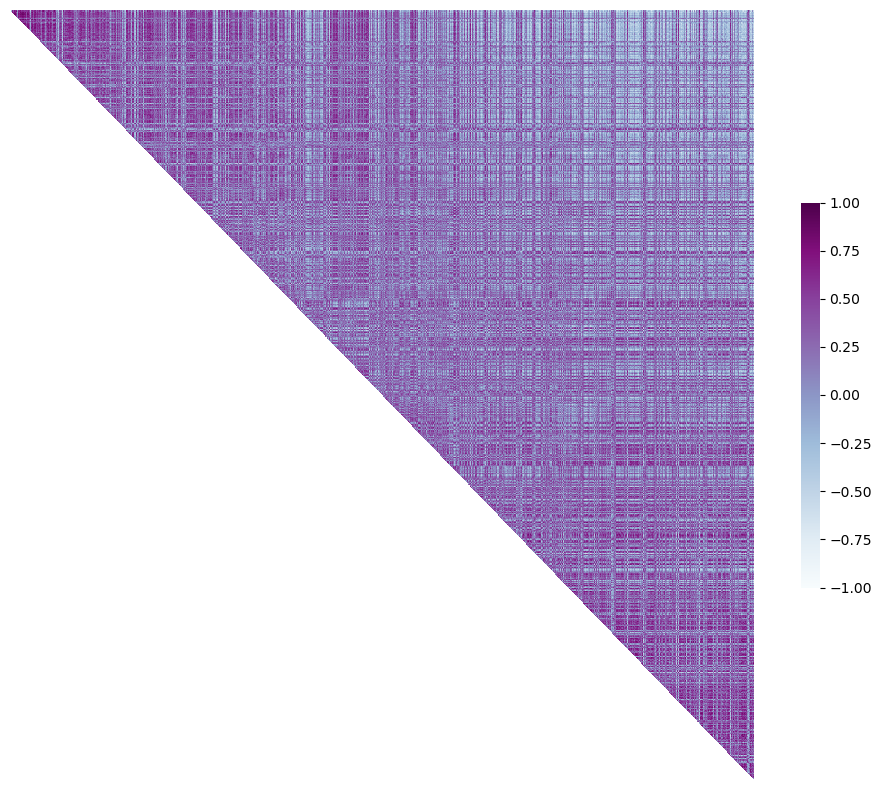

In [26]:
# Crear la máscara para la mitad inferior
mask = np.tril(np.ones_like(corr, dtype=bool))

# Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr,
    cmap='BuPu',
    mask=mask,
    vmin=-1, vmax=1,
    cbar_kws={"shrink": .5},
    xticklabels=False,
    yticklabels=False
)

# Guardar como PNG
plt.savefig("./Figuras/correlaciones_biomarcadores.png", dpi=500, bbox_inches='tight')
plt.show()


In [27]:
X_uncorrelated["Sample_diagnosis"] = y

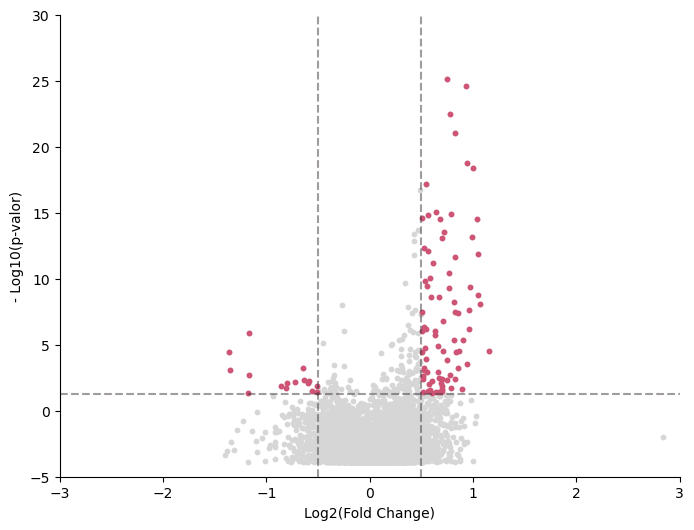

Resultados completos:
(220, 4)
Resultados filtrados:
     column  log2_fold_change       p_value     test_used
2         3          1.049756  1.598999e-09  Mann-Whitney
3         4          0.986528  6.827683e-14  Mann-Whitney
7        13          0.683327  2.751419e-15  Mann-Whitney
9        20          0.644870  8.547444e-16  Mann-Whitney
11       27          0.698653  7.679074e-14  Mann-Whitney
...     ...               ...           ...           ...
5893   6478          0.703321  2.200105e-02  Mann-Whitney
6261   6883          1.061947  7.947149e-09  Mann-Whitney
6702   7438          0.821624  2.169433e-12  Mann-Whitney
7141   8056          1.158332  3.125580e-05  Mann-Whitney
7144   8059          0.711686  1.512754e-07  Mann-Whitney

[98 rows x 4 columns]
(98, 4)


In [28]:
# Dividir el DataFrame en dos grupos: uno para diagnosis == 2 (Alzheimer), y el otro para el resto
group_1 = X_uncorrelated[X_uncorrelated['Sample_diagnosis'] == 2]
group_others = X_uncorrelated[X_uncorrelated['Sample_diagnosis'] != 2]


# Crear listas para almacenar los resultados
normality_results = []
results_list = []

columns_to_delete = ["Sample_diagnosis"]
columns_to_analyze = [item for item in X_uncorrelated.columns if item not in columns_to_delete]

for col in columns_to_analyze:
    # Comprobar la normalidad con el test de Shapiro-Wilk para cada grupo
    _, p_normal_group_1 = stats.shapiro(group_1[col].dropna())
    _, p_normal_group_others = stats.shapiro(group_others[col].dropna())

    # Guardar los resultados del test de normalidad
    normality_results.append({
        'column': col,
        'p_value_group_1': p_normal_group_1 > 0.05,
        'p_value_group_others': p_normal_group_others > 0.05
    })

    # Test de Mann-Whitney
    u_stat, p_value = stats.mannwhitneyu(group_1[col], group_others[col], alternative='two-sided')
    t_stat = u_stat
    test_used = 'Mann-Whitney'
    
    # Calcular log2 fold change entre los dos grupos
    log2_fc = np.log2(group_1[col].mean() / group_others[col].mean())

    # Guardar los resultados
    results_list.append({'column': col, 
                         'log2_fold_change': log2_fc, 
                         'p_value': p_value*7976, # Corrección de Bonferroni
                         'test_used': test_used})

# Convertir a DataFrame
results_df_AD_TODO = pd.DataFrame(results_list)

# Filtrar los resultados significativos (p-valor < 0.05 y log2 fold change > 0.5)
p_value_threshold = 0.05
log2_fc_threshold = 0.5

filtered_results_df_AD_TODO = results_df_AD_TODO[(results_df_AD_TODO['p_value'] < p_value_threshold) & 
                                  (np.abs(results_df_AD_TODO['log2_fold_change']) > log2_fc_threshold)]

# Volcano Plot
plt.figure(figsize=(8, 6))
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.axhline(y=1.3, color='#433A3F', linestyle='--', alpha=0.5)
plt.axvline(x=0.5, color='#433A3F', linestyle='--', alpha=0.5)
plt.axvline(x=-0.5, color='#433A3F', linestyle='--', alpha=0.5)
            
plt.scatter(results_df_AD_TODO['log2_fold_change'], -np.log10(results_df_AD_TODO['p_value']), color='#d6d6d6', s=10)

# Resaltar los puntos significativos
plt.scatter(filtered_results_df_AD_TODO['log2_fold_change'], 
            -np.log10(filtered_results_df_AD_TODO['p_value']), color='#CE5374', s=10)

#plt.title("Volcano Plot")
plt.xlabel("Log2(Fold Change)")
plt.ylabel("- Log10(p-valor)")
plt.ylim(-5, 30)
plt.xlim(-3, 3)

plt.grid(False)

# Guardar como PNG
plt.savefig("./Figuras/volcano_plot.png", dpi=500)

plt.show()

normality_df = pd.DataFrame(normality_results)
normality_df.to_csv('normality_test_results_AD_TODO.csv', index=False)

results_df_AD_TODO.to_csv('results_df_with_tests_AD_TODO.csv', index=False)
filtered_results_df_AD_TODO.to_csv('filtered_results_df_with_tests_AD_TODO.csv', index=False)


print("Resultados completos:")
results_df_sorted_AD_TODO = results_df_AD_TODO.sort_values(by="p_value", ascending=True)
print(results_df_sorted_AD_TODO[results_df_sorted_AD_TODO["p_value"] < 0.05].shape)

print("Resultados filtrados:")
print(filtered_results_df_AD_TODO)
print(filtered_results_df_AD_TODO.shape)

In [29]:
filtered_var = filtered_results_df_AD_TODO["column"].tolist()
df_filtered = X_uncorrelated[filtered_var]
df_filtered

,3,4,13,20,27,31,38,40,41,45,59,61,62,65,76,77,78,90,92,93,94,96,103,105,114,123,126,131,136,144,153,207,220,235,243,249,251,257,304,312,327,335,336,353,401,420,436,447,477,483,502,679,787,794,814,895,916,944,947,1061,1098,1293,1294,1298,1314,1335,1448,1544,1548,1579,1613,1648,1656,1853,2042,2083,2425,2442,2457,2470,2678,3136,3543,4023,4574,4828,5075,5313,5638,5739,6252,6331,6342,6478,6883,7438,8056,8059
0,747.362250,4584.640077,13897.573800,5111.521371,2582.582080,-2.273000,2306.639936,6942.195203,789.640041,1227.419753,2839.431028,1608.829076,1305.156337,1550.640288,3709.080653,964.206406,3810.456433,2783.060640,1076.947183,1184.687362,1236.057151,2471.659703,2184.807160,6237.565345,2294.365738,3260.845144,599.162679,858.739227,1891.590219,1838.402030,1737.026250,1405.767654,1044.501443,1988.973675,2772.684677,1515.621162,1200.350525,1946.104014,806.038950,1839.376419,413.067052,1020.833817,2024.698393,3746.629802,1249.207409,1244.414497,750.308740,2420.856773,3772.458232,601.292719,2172.932456,772.397647,2377.493679,3527.043942,1507.542604,918.399253,2174.847594,1487.513685,1007.796628,1970.294112,1146.718160,369.708087,541.990193,1350.784836,317.092200,1282.803249,735.544594,560.286535,1320.636885,1242.444828,693.503589,504.885855,2054.313860,707.590253,696.112651,457.280876,7056.413963,1040.570674,2944.443542,822.394084,302.397431,604.052382,1430.313528,1235.816942,3796.012687,622.534115,1442.046703,645.521561,715.565092,4628.036946,1994.645171,1858.089361,11175.421700,899.171861,1047.956759,1850.807926,1320.075051,1523.419945
1,426.744667,879.025263,1375.993735,5237.811985,2192.161326,158.126332,691.434397,864.784071,758.711749,738.086575,4422.626546,25403.830100,3404.135822,965.454562,3336.858470,598.130039,2622.834597,1893.587382,3963.470892,2018.320576,3710.075900,2528.548089,1804.211629,914.382704,1732.023521,5744.601969,448.351992,5524.600116,1524.298556,1122.107668,1078.893018,1640.124142,2143.256342,39219.709740,4971.505707,1190.537171,1270.131431,4580.287861,536.899462,705.253381,417.266877,791.601093,764.587284,3083.915776,730.495521,831.691743,576.112447,1413.923031,3828.511962,1794.703235,1957.087871,553.682174,1662.230869,3434.843277,1015.307799,545.648786,1218.474900,1254.886666,2461.224311,816.069325,861.825813,279.661203,365.672112,1027.604024,232.380352,789.187819,565.048015,2405.240469,957.086483,953.008817,596.334253,491.885717,12346.537310,587.614380,319.741336,498.279538,1282.538859,733.459846,2385.268309,658.793228,260.600450,514.859822,676.326015,792.693915,9041.233570,542.779722,1571.688116,1503.433439,986.234472,2148.264537,15455.805680,1393.514065,7910.383969,843.315343,927.804387,1474.835703,672.785745,914.652521
2,181.105244,742.411562,823.968890,5814.957548,444.567397,-0.799582,419.780366,537.718659,385.798146,521.327236,1385.674999,18341.203670,1029.061583,935.910321,3261.093759,464.556939,1125.810963,1643.540081,734.815536,1169.388163,788.387507,1625.549494,1587.569366,1355.290896,1382.476673,1512.008900,3350.646904,482.947316,1193.775403,659.255070,821.969936,398.217422,493.255505,754.021154,14344.467020,873.407837,301.608462,1142.027873,400.966457,483.437521,477.154012,483.437521,1124.748221,2371.632161,1180.597980,582.826851,380.887502,2110.975097,3118.372724,480.132836,1505.540235,475.346546,1491.604680,5078.452200,581.266037,339.823677,866.099284,1636.824540,677.928904,654.003535,634.033961,92.953936,228.085209,288.280048,319.810678,964.755389,437.723454,518.344242,820.909317,972.666094,440.662970,6951.751565,2328.141431,653.791868,114.565578,208.088499,969.284470,710.836179,2393.024414,349.008572,511.127448,471.980114,122.216794,402.711735,823.482448,382.937716,936.642021,2826.793552,942.599980,857.216832,651.531866,1070.113005,5520.452034,1352.966116,624.186897,2058.379326,649.841296,524.759062
3,349.894758,1635.340642,3099.992605,6423.481764,1197.205628,-2.725568,1272.840133,1377.433795,1600.248958,961.444019,13314.057700,1279.313357,1491.907640,1304.524858,4563.963176,1134.517571,35

In [30]:
# Estandarizar los datos
standard_scaler = StandardScaler()
df_filtered = standard_scaler.fit_transform(df_filtered)

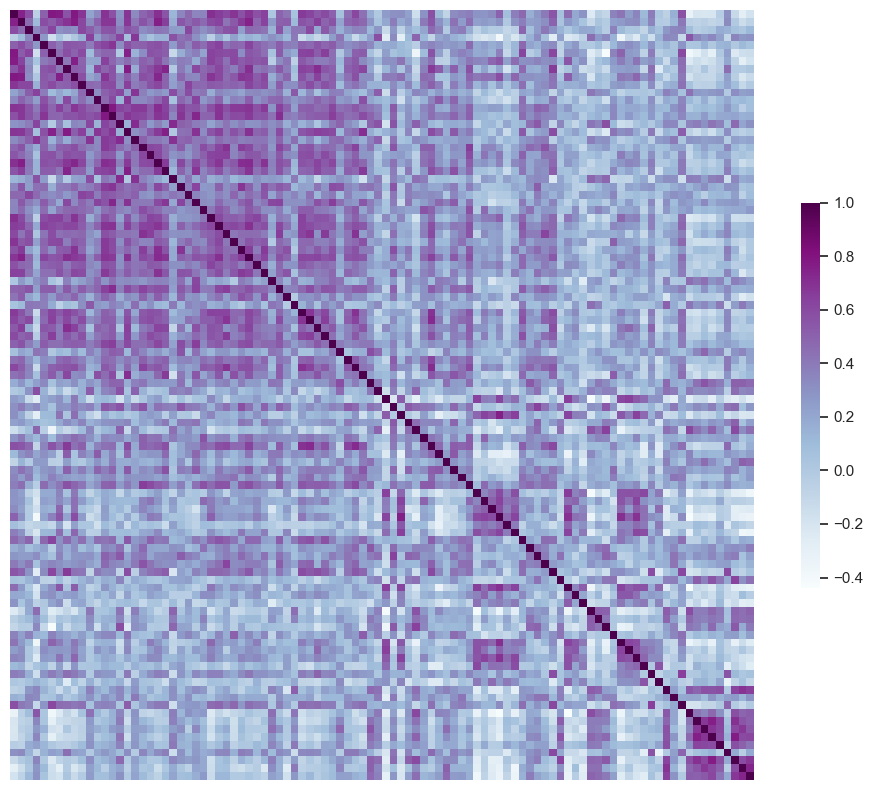

In [133]:
# Crear la máscara para la mitad inferior
#mask = np.tril(np.ones_like(corr, dtype=bool))

# Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    X_uncorrelated[filtered_var].corr(method='spearman'),
    cmap='BuPu',
    #mask=mask,
    #vmin=-1, vmax=1,
    cbar_kws={"shrink": .5},
    xticklabels=False,
    yticklabels=False
)

# Guardar como PNG
plt.savefig("./Figuras/correlaciones_pvalor.png", dpi=500, bbox_inches='tight')
plt.show()

## 4. Aplicación de los modelos de Machine learning

In [33]:
# Generar las particiones de los datos
X = df_filtered
y = X_uncorrelated['Sample_diagnosis']

# Dividir en entrenamiento y test (test = 0.25)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

print("Distribución antes de SMOTE:", Counter(y_train))

Distribución antes de SMOTE: Counter({2: 262, 0: 90, 1: 60, 3: 22, 4: 22})


In [34]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Después del oversampling
print("Distribución después de SMOTE:", Counter(y_resampled))

Distribución después de SMOTE: Counter({2: 262, 0: 262, 1: 262, 3: 262, 4: 262})


In [35]:
# Inicializar dataframe de resultados
pvalue_results_df = pd.DataFrame(columns=["ID", "Modelo", "Precisión global", "Precision AD", "Recall AD", "AUC ROC AD"])

### 4.1. Decision Tree

In [36]:
dt_model = DecisionTreeClassifier()

parameters = {'max_depth': [3, 4, 5, 6, 7, 12, None]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(dt_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
dt_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = dt_best_model.predict(X_test)
y_pred_binary = (y_pred == 2).astype(int)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'Decision Trees:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

Decision Trees:
              precision    recall  f1-score   support

           0       0.72      0.77      0.74        30
           1       0.46      0.60      0.52        20
           2       0.89      0.80      0.84        88
           3       1.00      0.88      0.93         8
           4       0.56      0.71      0.63         7

    accuracy                           0.76       153
   macro avg       0.72      0.75      0.73       153
weighted avg       0.79      0.76      0.77       153

Best Parameters: {'max_depth': None}



In [38]:
cvscores = cross_val_score(dt_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

72.00 +/- 8.07 %


<Axes: >

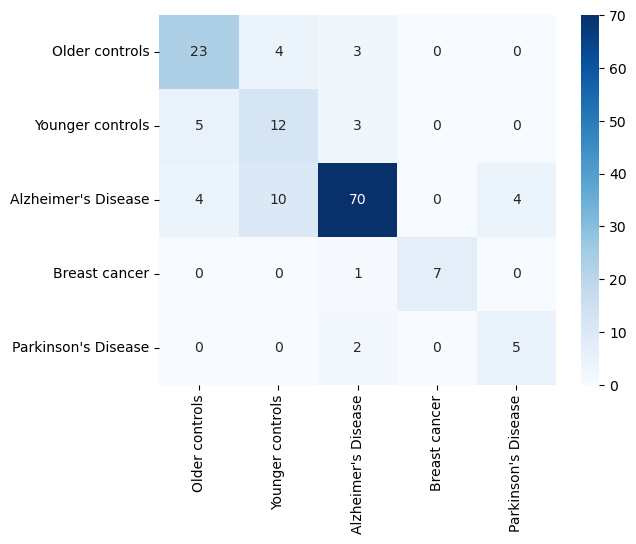

In [39]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

In [41]:
# Binarizar las clases
classes = [0, 1, 2, 3, 4]
y_test_bin = label_binarize(y_test, classes=classes)
y_pred_bin = label_binarize(y_pred, classes=classes)
n_classes = y_test_bin.shape[1]


def plot_roc_curve(y_test, y_pred, model_name):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= n_classes

    # Curva ROC
    plt.figure(figsize=(10, 8))
    colors = cycle(['gray', 'brown', 'red', 'pink', 'blue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {model_name}')
    plt.legend(loc="lower right")
    plt.show()
    
    return roc_auc

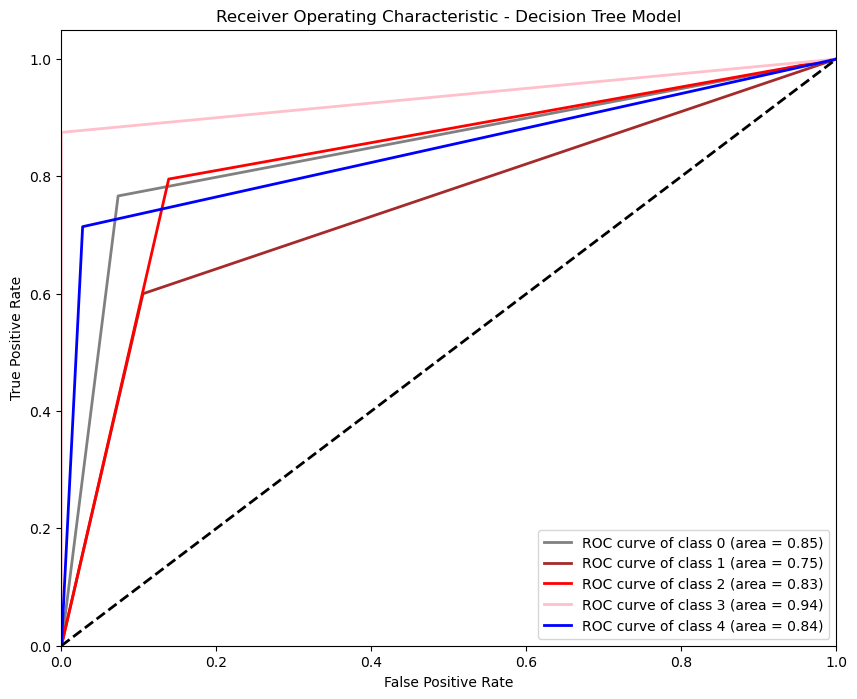

In [42]:
y_pred_seq_prob = dt_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "Decision Tree Model")

In [43]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 1,
        "Modelo": "Decision Tree",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [44]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.85


### 4.2. Random Forest

In [45]:
rf_model = RandomForestClassifier()

parameters = {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7, 12, None]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(rf_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
rf_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = rf_best_model.predict(X_test)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'Random Forest:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

Random Forest:
              precision    recall  f1-score   support

           0       0.93      0.83      0.88        30
           1       0.68      0.85      0.76        20
           2       0.93      0.93      0.93        88
           3       1.00      1.00      1.00         8
           4       1.00      0.71      0.83         7

    accuracy                           0.90       153
   macro avg       0.91      0.87      0.88       153
weighted avg       0.90      0.90      0.90       153

Best Parameters: {'max_depth': None, 'n_estimators': 100}



In [46]:
cvscores = cross_val_score(rf_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

78.43 +/- 2.58 %


<Axes: >

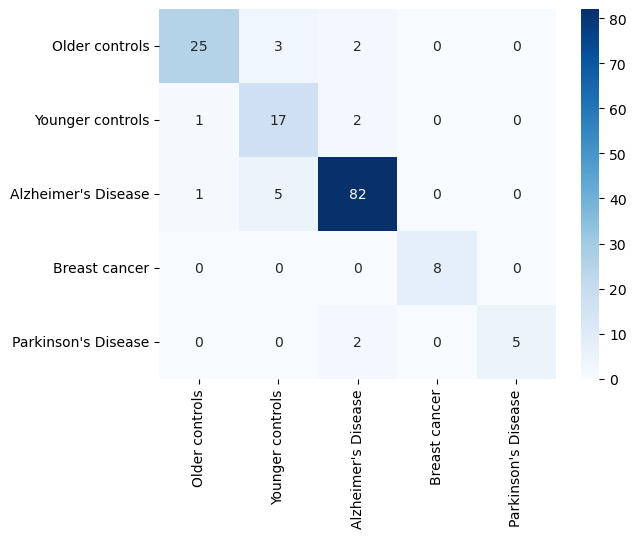

In [47]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

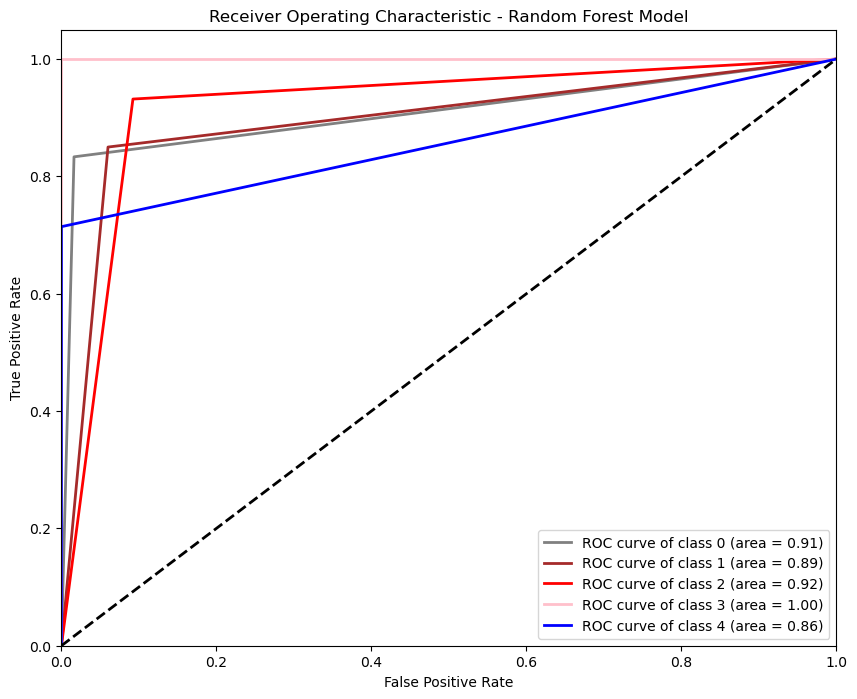

In [48]:
y_pred_bin = label_binarize(y_pred, classes=classes)

y_pred_seq_prob = rf_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "Random Forest Model")

In [49]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 2,
        "Modelo": "Random Forest",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [50]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.850
1,2,Random Forest,89.542,93.182,93.182,91.976


### 4.3. SVM

In [51]:
svm_model = SVC()

parameters = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 'scale', 'auto'], 'kernel': ['linear', 'rbf', 'sigmoid', 'poly']}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(svm_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
svm_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = svm_best_model.predict(X_test)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'SVM:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

SVM:
              precision    recall  f1-score   support

           0       0.82      0.30      0.44        30
           1       0.64      0.45      0.53        20
           2       0.74      0.98      0.84        88
           3       1.00      0.88      0.93         8
           4       1.00      0.71      0.83         7

    accuracy                           0.76       153
   macro avg       0.84      0.66      0.72       153
weighted avg       0.77      0.76      0.73       153

Best Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}



In [52]:
cvscores = cross_val_score(svm_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

69.94 +/- 1.18 %


<Axes: >

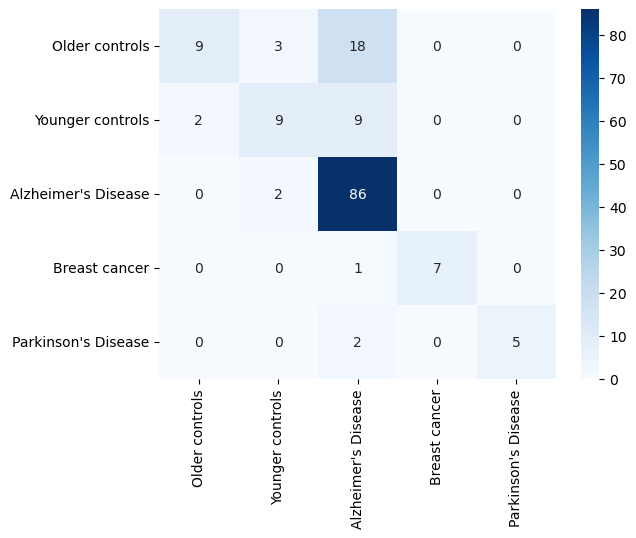

In [53]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

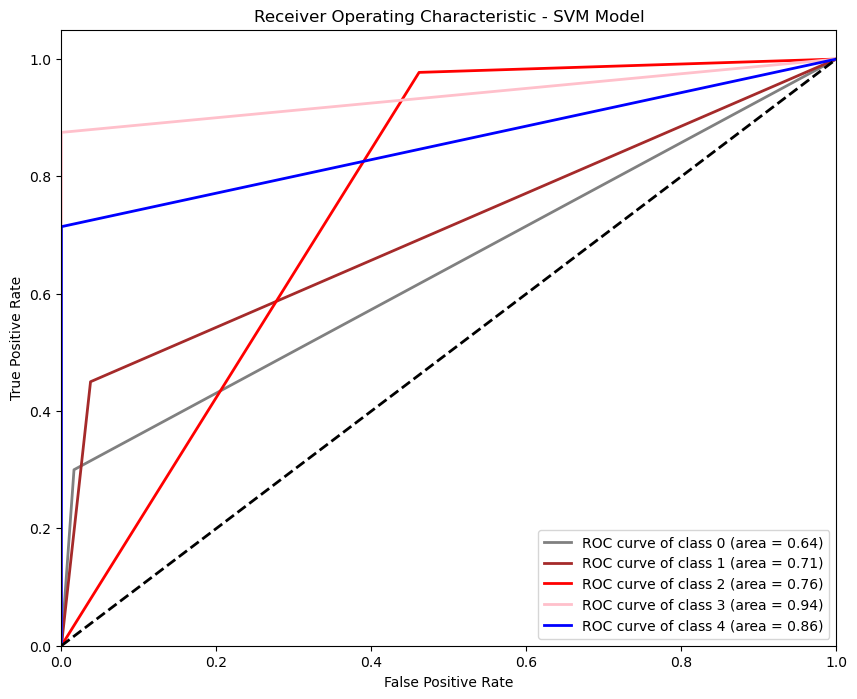

In [54]:
y_pred_bin = label_binarize(y_pred, classes=classes)

y_pred_seq_prob = svm_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "SVM Model")

In [55]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 3,
        "Modelo": "SVM",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [56]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.850
1,2,Random Forest,89.542,93.182,93.182,91.976
2,3,SVM,75.817,74.138,97.727,75.787


### 4.4. K-Nearest Neighbors

In [57]:
knn_model = KNeighborsClassifier()

parameters = {'n_neighbors': [3, 5, 6, 7, 8, 9, 10]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(knn_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
knn_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = knn_best_model.predict(X_test)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'KNN:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

KNN:
              precision    recall  f1-score   support

           0       0.56      0.77      0.65        30
           1       0.38      0.75      0.51        20
           2       0.94      0.57      0.71        88
           3       1.00      1.00      1.00         8
           4       0.58      1.00      0.74         7

    accuracy                           0.67       153
   macro avg       0.69      0.82      0.72       153
weighted avg       0.78      0.67      0.69       153

Best Parameters: {'n_neighbors': 3}



In [58]:
cvscores = cross_val_score(knn_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

72.47 +/- 6.45 %


<Axes: >

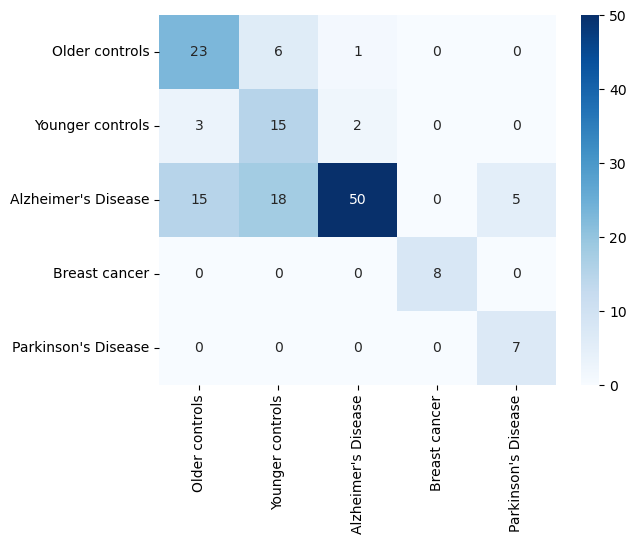

In [59]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

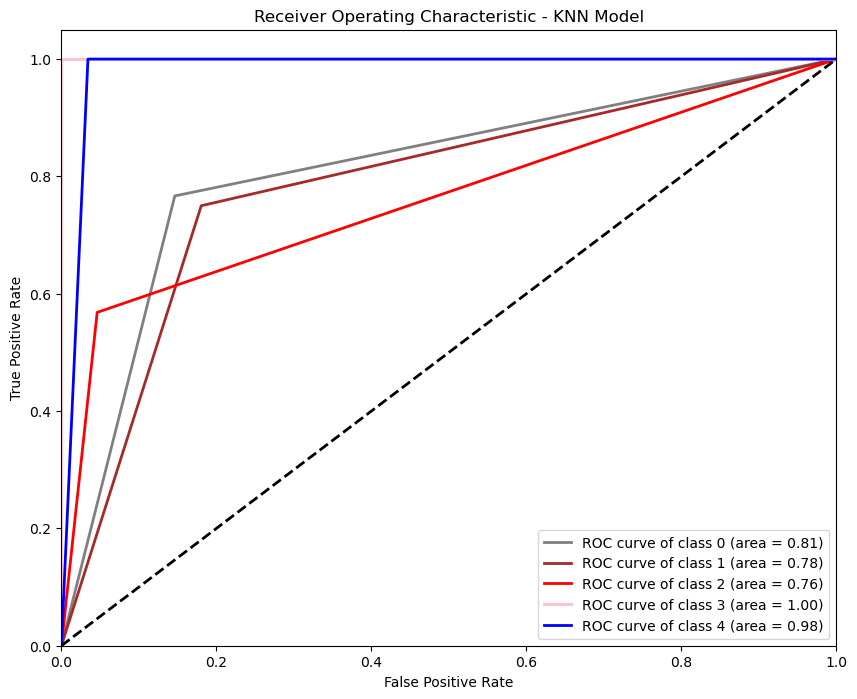

In [60]:
y_pred_bin = label_binarize(y_pred, classes=classes)

y_pred_seq_prob = knn_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "KNN Model")

In [61]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 4,
        "Modelo": "KNN Model",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [62]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.850
1,2,Random Forest,89.542,93.182,93.182,91.976
2,3,SVM,75.817,74.138,97.727,75.787
3,4,KNN Model,67.320,94.340,56.818,76.101


### 4.5. Logistic Regression

In [63]:
lr_model = LogisticRegression()

parameters = {'C': [0.1, 1, 10], 'max_iter': [500, 1000, 1500]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(lr_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
lr_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = lr_best_model.predict(X_test)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'Logistic Regression:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

Logistic Regression:
              precision    recall  f1-score   support

           0       0.67      0.53      0.59        30
           1       0.41      0.55      0.47        20
           2       0.84      0.86      0.85        88
           3       1.00      1.00      1.00         8
           4       1.00      0.57      0.73         7

    accuracy                           0.75       153
   macro avg       0.78      0.70      0.73       153
weighted avg       0.77      0.75      0.75       153

Best Parameters: {'C': 10, 'max_iter': 500}



In [64]:
cvscores = cross_val_score(lr_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

69.87 +/- 5.91 %


<Axes: >

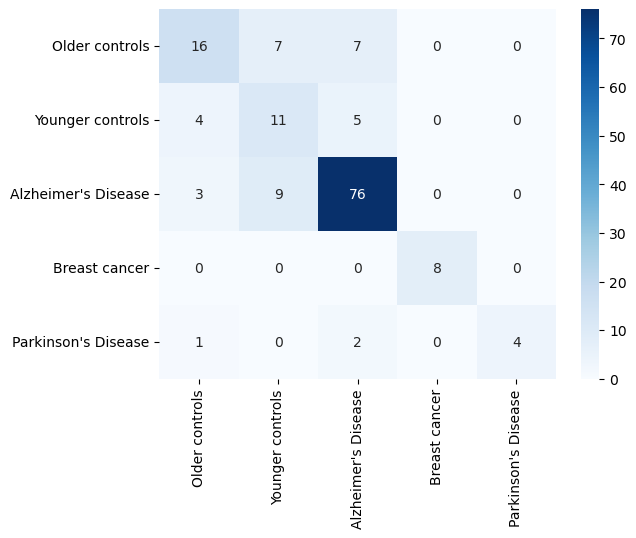

In [65]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

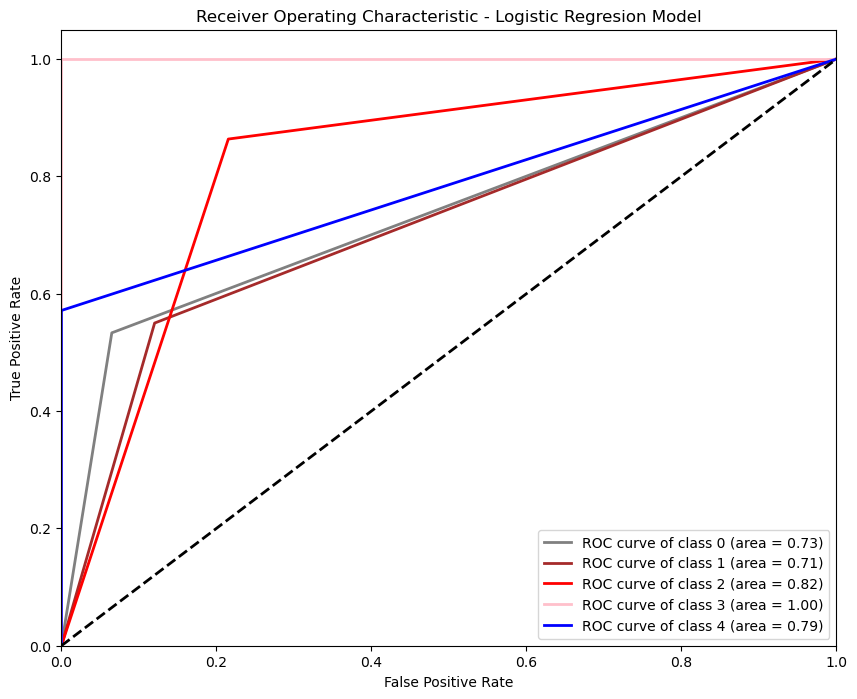

In [66]:
y_pred_bin = label_binarize(y_pred, classes=classes)

y_pred_seq_prob = lr_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "Logistic Regresion Model")

In [67]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 5,
        "Modelo": "Logistic Regression",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [68]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.850
1,2,Random Forest,89.542,93.182,93.182,91.976
2,3,SVM,75.817,74.138,97.727,75.787
3,4,KNN Model,67.320,94.340,56.818,76.101
4,5,Logistic Regresion,75.163,84.444,86.364,82.413


### 4.6. XGBoost

In [69]:
xgb_model = XGBClassifier()

parameters = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1], 'max_depth': [3, 5, 7]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(xgb_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
xgb_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = xgb_best_model.predict(X_test)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'XGBoost:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

XGBoost:
              precision    recall  f1-score   support

           0       0.81      0.83      0.82        30
           1       0.58      0.70      0.64        20
           2       0.95      0.90      0.92        88
           3       1.00      1.00      1.00         8
           4       0.86      0.86      0.86         7

    accuracy                           0.86       153
   macro avg       0.84      0.86      0.85       153
weighted avg       0.87      0.86      0.87       153

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}



In [70]:
cvscores = cross_val_score(xgb_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

79.70 +/- 5.35 %


<Axes: >

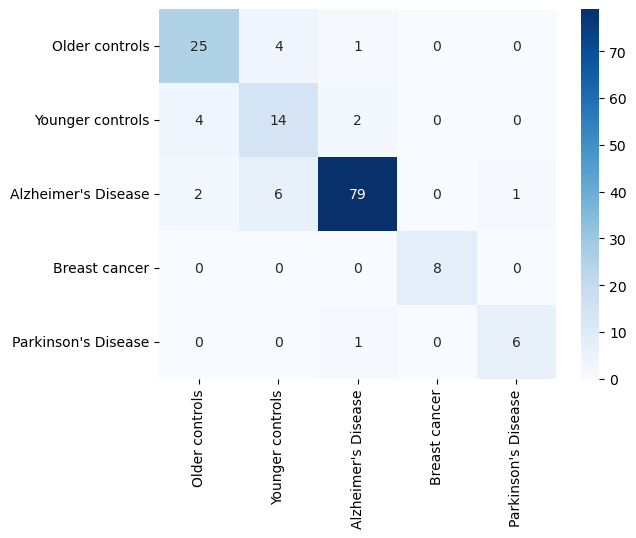

In [71]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

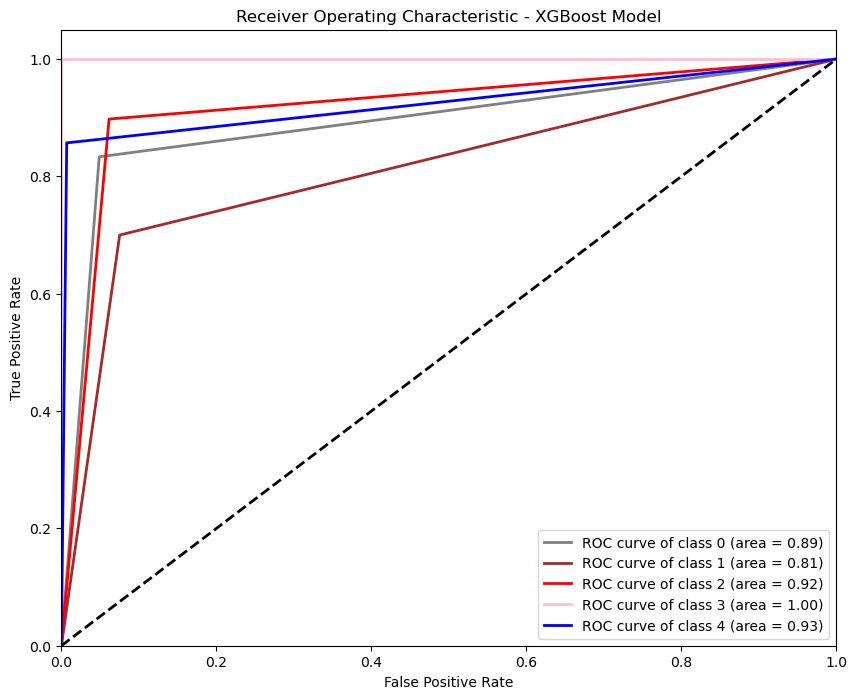

In [72]:
y_pred_bin = label_binarize(y_pred, classes=classes)

y_pred_seq_prob = xgb_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "XGBoost Model")

In [73]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 6,
        "Modelo": "XGBoost",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [74]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.850
1,2,Random Forest,89.542,93.182,93.182,91.976
2,3,SVM,75.817,74.138,97.727,75.787
3,4,KNN Model,67.320,94.340,56.818,76.101
4,5,Logistic Regresion,75.163,84.444,86.364,82.413
5,6,XGBoost,86.275,95.181,89.773,91.809


### 4.7. CatBoost

In [75]:
cat_model = CatBoostClassifier(verbose=0)

parameters = {'iterations': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}

# Ajuste con GridSearchCV
grid_search = GridSearchCV(cat_model, param_grid=parameters, cv=5, scoring='accuracy')
grid_search.fit(X_resampled, y_resampled)
    
# Guardar el mejor modelo
cat_best_model = grid_search.best_estimator_
    
# Evaluar el modelo
y_pred = cat_best_model.predict(X_test)
report_dict = classification_report(y_test, y_pred, output_dict=True)
report = classification_report(y_test, y_pred)

print(f'CatBoost:\n{report}\nBest Parameters: {grid_search.best_params_}\n')

CatBoost:
              precision    recall  f1-score   support

           0       0.82      0.77      0.79        30
           1       0.67      0.80      0.73        20
           2       0.93      0.93      0.93        88
           3       1.00      1.00      1.00         8
           4       1.00      0.71      0.83         7

    accuracy                           0.88       153
   macro avg       0.88      0.84      0.86       153
weighted avg       0.88      0.88      0.88       153

Best Parameters: {'iterations': 200, 'learning_rate': 1}



In [76]:
cvscores = cross_val_score(cat_best_model, X_test, y_test, cv=5)
print("{:.2f} +/- {:.2f} %".format(np.mean(cvscores)*100, np.std(cvscores)*100))

77.74 +/- 3.98 %


<Axes: >

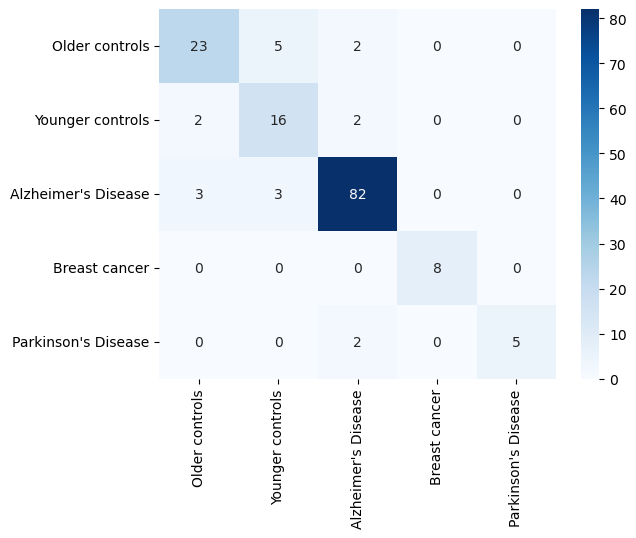

In [77]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

class_labels = ["Older controls", "Younger controls", "Alzheimer's Disease", "Breast cancer", "Parkinson's Disease"]  # Asume que las clases son enteros consecutivos
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)

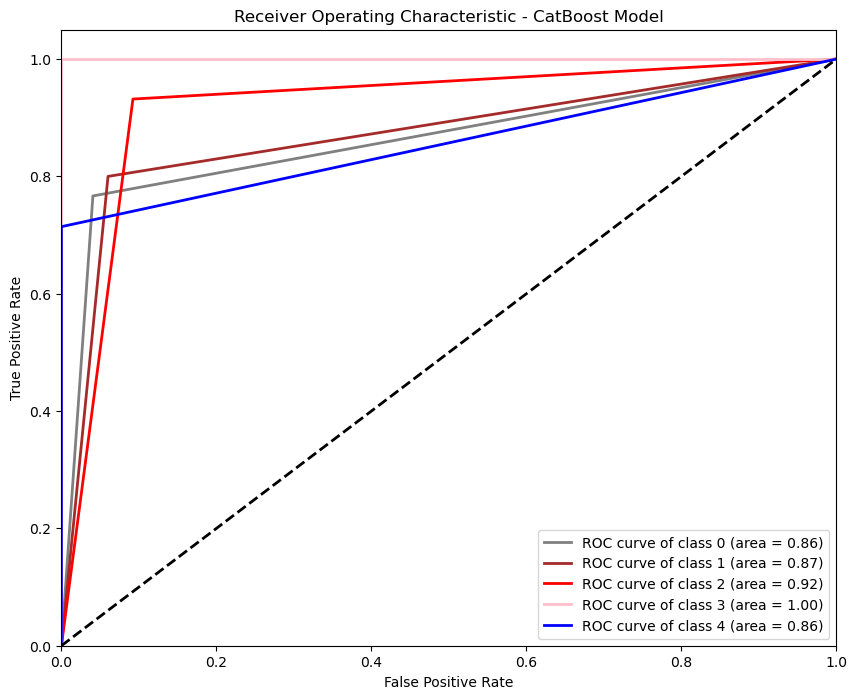

In [78]:
y_pred_bin = label_binarize(y_pred, classes=classes)

y_pred_seq_prob = cat_best_model.predict(X_test)
roc_auc = plot_roc_curve(y_test_bin, y_pred_seq_prob, "CatBoost Model")

In [79]:
# Añadir fila al DataFrame
pvalue_results_df = pd.concat([pvalue_results_df, pd.DataFrame({
        "ID": 7,
        "Modelo": "CatBoost",
        "Precisión global": [round(report_dict['accuracy']*100, 3)],
        "Precision AD": [round(report_dict['2']['precision']*100, 3)],
        "Recall AD": [round(report_dict['2']['recall']*100, 3)],
        "AUC ROC AD": [round(roc_auc[2]*100, 3)]
    })], ignore_index=True)

In [80]:
pvalue_results_df

,ID,Modelo,Precisión global,Precision AD,Recall AD,AUC ROC AD
0,1,Decision Tree,76.471,88.608,79.545,82.850
1,2,Random Forest,89.542,93.182,93.182,91.976
2,3,SVM,75.817,74.138,97.727,75.787
3,4,KNN Model,67.320,94.340,56.818,76.101
4,5,Logistic Regresion,75.163,84.444,86.364,82.413
5,6,XGBoost,86.275,95.181,89.773,91.809
6,7,CatBoost,87.582,93.182,93.182,91.976


In [81]:
# Guardar los resultados
pvalue_results_df.to_csv("pvalue_results.csv", index=False)

## 5. Interpretabilidad del modelo

In [82]:
# Cargar el archivo CSV con los id de las proteinas
archivo_csv = 'protein_id_df.csv'
protein_df = pd.read_csv(archivo_csv)

protein_df

,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,1,NM_024548.2,IOH27601,Q8IW35,LRRIQ2,leucine-rich repeats and IQ motif containing 2...
1,2,BC011414.1,IOH9720,Q9NRY5,C5orf3,chromosome 5 open reading frame 3 (C5orf3)
2,3,BC004932.1,IOH5521,Q9BSN7,C16orf30,chromosome 16 open reading frame 30 (C16orf30)
3,4,BC037854.1,IOH27633,O14576,DYNC1I1,"dynein, cytoplasmic 1, intermediate chain 1 (D..."
4,5,BC051687.1,IOH26538,P57682,KLF3,Kruppel-like factor 3 (basic) (KLF3)
...,...,...,...,...,...,...
9091,9476,NM_002939.3,IOH25734,P13489,RNH1,Ribonuclease inhibitor
9092,9477,NM_153500.1,IOH37934,A8K7Q7,CAMKK2,calcium/calmodulin-dependent protein kinase ki...
9093,9478,NM_001017973.1,IOH26049,O15460,P4HA2,Prolyl 4-hydroxylase subunit alpha-2
9094,9479,NM_001014291.1,IOH57344,Q9BYE4,SPRR2G,Small proline-rich protein 2G


In [84]:
# Mostrar la importancia de las variables
importance = rf_best_model.feature_importances_
rf_importance_df = pd.DataFrame({'Feature': filtered_var, 'Importance': importance})
rf_importance_df = rf_importance_df.sort_values(by='Importance', ascending=False)
rf_importance_df['Feature'] = rf_importance_df['Feature'].astype('int64')

rf_importance_df

,Feature,Importance
84,4574,0.047414
47,447,0.044075
92,6342,0.042715
79,2470,0.039862
95,7438,0.039292
...,...,...
82,3543,0.002876
34,243,0.002776
52,787,0.002717
43,353,0.002152


In [85]:
# Unir la información basada en la columna 'Feature' y 'ID_number'
rf_importance_merged = rf_importance_df.merge(protein_df, left_on='Feature', right_on='ID', how='left')

rf_importance_merged.head(10)

,Feature,Importance,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,4574,0.047414,4574.0,NM_014110.3,IOH39485,Q12972,PPP1R8,"protein phosphatase 1, regulatory (inhibitor) ..."
1,447,0.044075,447.0,NM_015833.1,IOH38242,P78563,ADARB1,"adenosine deaminase, RNA-specific, B1 (RED1 ho..."
2,6342,0.042715,6342.0,NM_032349.1,IOH6316,Q9BRJ7,NUDT16L1,nudix (nucleoside diphosphate linked moiety X)...
3,2470,0.039862,2470.0,NM_016532.2,IOH4433,Q9BT40,SKIP,skeletal muscle and kidney enriched inositol p...
4,7438,0.039292,7438.0,NM_000975.2,IOH1740,P62913,RPL11,ribosomal protein L11 (RPL11)
5,1648,0.037038,1648.0,NM_018037.1,IOH45458,Q9NW78,RALGPS2,Ral GEF with PH domain and SH3 binding motif 2...
6,1656,0.032696,1656.0,NM_015122.1,IOH26137,O14526,FCHO1,FCH domain only 1 (FCHO1)
7,31,0.032358,31.0,BC030524.1,IOH21689,Q8N6F1,CLDN19,claudin 19 (CLDN19)
8,8056,0.029825,8056.0,NM_021178.1,IOH3409,Q9NPC3,CCNB1IP1,"cyclin B1 interacting protein 1 (CCNB1IP1), tr..."
9,20,0.024144,20.0,BC005332.1,IOH7177,P01834,ENTPD1,"cDNA clone MGC:12418 IMAGE:3934658, complete cds"


In [126]:
rf_importance_merged.head(20)

,Feature,Importance,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,4574,0.047414,4574.0,NM_014110.3,IOH39485,Q12972,PPP1R8,"protein phosphatase 1, regulatory (inhibitor) ..."
1,447,0.044075,447.0,NM_015833.1,IOH38242,P78563,ADARB1,"adenosine deaminase, RNA-specific, B1 (RED1 ho..."
2,6342,0.042715,6342.0,NM_032349.1,IOH6316,Q9BRJ7,NUDT16L1,nudix (nucleoside diphosphate linked moiety X)...
3,2470,0.039862,2470.0,NM_016532.2,IOH4433,Q9BT40,SKIP,skeletal muscle and kidney enriched inositol p...
4,7438,0.039292,7438.0,NM_000975.2,IOH1740,P62913,RPL11,ribosomal protein L11 (RPL11)
5,1648,0.037038,1648.0,NM_018037.1,IOH45458,Q9NW78,RALGPS2,Ral GEF with PH domain and SH3 binding motif 2...
6,1656,0.032696,1656.0,NM_015122.1,IOH26137,O14526,FCHO1,FCH domain only 1 (FCHO1)
7,31,0.032358,31.0,BC030524.1,IOH21689,Q8N6F1,CLDN19,claudin 19 (CLDN19)
8,8056,0.029825,8056.0,NM_021178.1,IOH3409,Q9NPC3,CCNB1IP1,"cyclin B1 interacting protein 1 (CCNB1IP1), tr..."
9,20,0.024144,20.0,BC005332.1,IOH7177,P01834,ENTPD1,"cDNA clone MGC:12418 IMAGE:3934658, complete cds"


In [127]:
rf_importance_merged.loc[rf_importance_merged['Feature'] == 5075, 'Gene Symbol'] = 'IL20'

rf_importance_merged.head(20)

,Feature,Importance,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,4574,0.047414,4574.0,NM_014110.3,IOH39485,Q12972,PPP1R8,"protein phosphatase 1, regulatory (inhibitor) ..."
1,447,0.044075,447.0,NM_015833.1,IOH38242,P78563,ADARB1,"adenosine deaminase, RNA-specific, B1 (RED1 ho..."
2,6342,0.042715,6342.0,NM_032349.1,IOH6316,Q9BRJ7,NUDT16L1,nudix (nucleoside diphosphate linked moiety X)...
3,2470,0.039862,2470.0,NM_016532.2,IOH4433,Q9BT40,SKIP,skeletal muscle and kidney enriched inositol p...
4,7438,0.039292,7438.0,NM_000975.2,IOH1740,P62913,RPL11,ribosomal protein L11 (RPL11)
5,1648,0.037038,1648.0,NM_018037.1,IOH45458,Q9NW78,RALGPS2,Ral GEF with PH domain and SH3 binding motif 2...
6,1656,0.032696,1656.0,NM_015122.1,IOH26137,O14526,FCHO1,FCH domain only 1 (FCHO1)
7,31,0.032358,31.0,BC030524.1,IOH21689,Q8N6F1,CLDN19,claudin 19 (CLDN19)
8,8056,0.029825,8056.0,NM_021178.1,IOH3409,Q9NPC3,CCNB1IP1,"cyclin B1 interacting protein 1 (CCNB1IP1), tr..."
9,20,0.024144,20.0,BC005332.1,IOH7177,P01834,ENTPD1,"cDNA clone MGC:12418 IMAGE:3934658, complete cds"


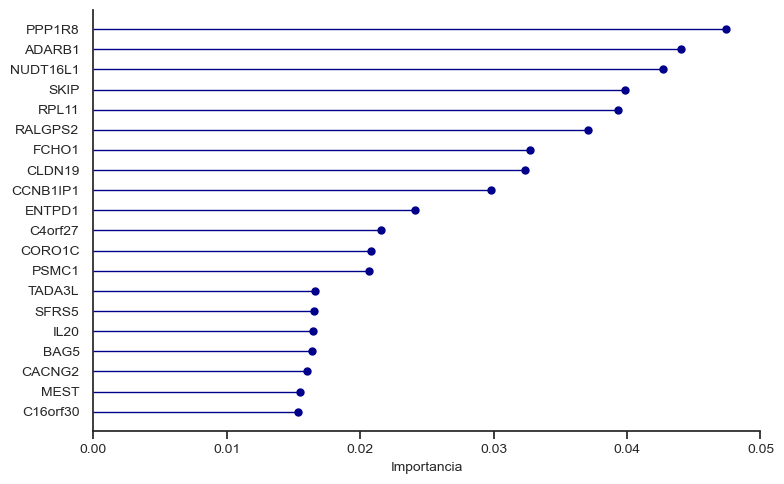

In [128]:
# Ordenar y seleccionar las 20 variables más importantes
df_plot = rf_importance_merged.sort_values(by='Importance', ascending=False).head(20)
df_plot = df_plot.dropna(subset=['Gene Symbol'])  # por si acaso
df_plot['Gene Symbol'] = df_plot['Gene Symbol'].astype(str)
df_plot = df_plot.iloc[::-1]


# Gráfica
plt.figure(figsize=(8, 5))
sns.set_style("ticks")
plt.tick_params(axis='y', length=0)

plt.hlines(
    y=df_plot['Gene Symbol'],
    xmin=0,
    xmax=df_plot['Importance'],
    color='darkblue',
    linewidth=1)

plt.plot(
    df_plot['Importance'],
    df_plot['Gene Symbol'],
    'o',
    markersize=5,
    color='darkblue')

plt.xlabel('Importancia', fontsize=10)
plt.xlim(0, 0.05)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tick_params(axis='y', which='major', pad=10)


sns.despine()
plt.grid(False)
plt.tight_layout()

# Guardar como PNG
plt.savefig("./Figuras/variables_p-value_rf.png", dpi=500)

plt.show()

In [88]:
# Mostrar la importancia de las variables
importance = cat_best_model.feature_importances_
cat_importance_df = pd.DataFrame({'Feature': filtered_var, 'Importance': importance})
cat_importance_df = cat_importance_df.sort_values(by='Importance', ascending=False)
cat_importance_df['Feature'] = rf_importance_df['Feature'].astype('int64')

cat_importance_df

,Feature,Importance
88,5638,6.226840
96,8056,5.168395
7,40,5.013196
48,477,4.009089
93,6478,3.918317
...,...,...
91,6331,0.034731
64,1314,0.021293
60,1098,0.018316
34,243,0.007744


In [89]:
# Unir la información basada en la columna 'Feature' y 'ID_number'
cat_importance_merged = cat_importance_df.merge(protein_df, left_on='Feature', right_on='ID', how='left')

cat_importance_merged.head(10)

,Feature,Importance,ID,Database_ID,Ulitmate ORF ID,Swissprot ID,Gene Symbol,Protein Header
0,5638,6.226840,5638.0,NM_017867.1,IOH12106,Q9NWY4,C4orf27,chromosome 4 open reading frame 27 (C4orf27)
1,8056,5.168395,8056.0,NM_021178.1,IOH3409,Q9NPC3,CCNB1IP1,"cyclin B1 interacting protein 1 (CCNB1IP1), tr..."
2,40,5.013196,40.0,BC068448.1,IOH40093,Q8N987,EFCBP1,EF-hand calcium binding protein 1 (EFCBP1)
3,477,4.009089,477.0,NM_003668.2,PMX_10066,Q8IW41,MAPKAPK5,mitogen-activated protein kinase-activated pro...
4,6478,3.918317,6478.0,NM_002802.1,IOH3591,P62191,PSMC1,"proteasome (prosome, macropain) 26S subunit, A..."
5,401,3.736067,401.0,NM_153345.1,IOH27468,Q8IV31,TMEM139,transmembrane protein 139 (TMEM139)
6,59,3.475635,59.0,NM_017451.1,IOH42068,Q9UQB8,BAIAP2,"BAI1-associated protein 2 (BAIAP2), transcript..."
7,41,3.445268,41.0,NM_006078.2,IOH40316,Q9Y698,CACNG2,"calcium channel, voltage-dependent, gamma subu..."
8,1853,3.182537,1853.0,NM_018091.2,IOH3126,Q9H9T3,ELP3,elongation protein 3 homolog (S. cerevisiae) (...
9,3,3.158472,3.0,BC004932.1,IOH5521,Q9BSN7,C16orf30,chromosome 16 open reading frame 30 (C16orf30)


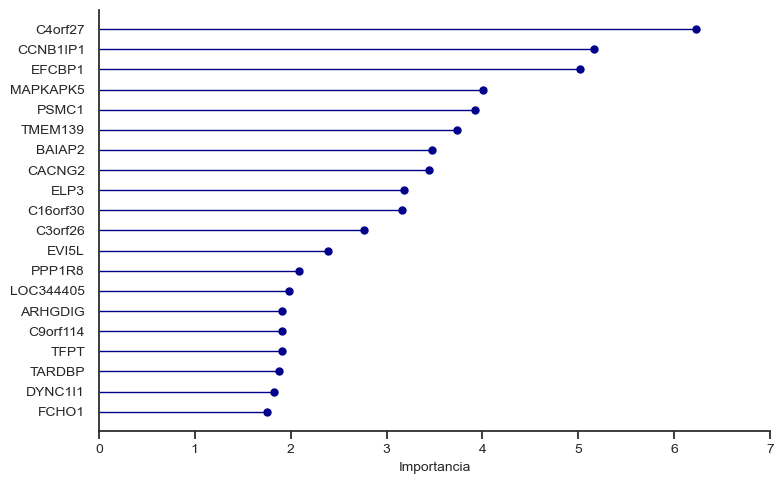

In [125]:
# Ordenar y seleccionar las 20 variables más importantes
df_plot = cat_importance_merged.sort_values(by='Importance', ascending=False).head(20)
df_plot = df_plot.dropna(subset=['Gene Symbol'])  # por si acaso
df_plot['Gene Symbol'] = df_plot['Gene Symbol'].astype(str)
df_plot = df_plot.iloc[::-1]


# Gráfica
plt.figure(figsize=(8, 5))
sns.set_style("ticks")
plt.tick_params(axis='y', length=0)

plt.hlines(
    y=df_plot['Gene Symbol'],
    xmin=0,
    xmax=df_plot['Importance'],
    color='darkblue',
    linewidth=1)

plt.plot(
    df_plot['Importance'],
    df_plot['Gene Symbol'],
    'o',
    markersize=5,
    color='darkblue')

plt.xlabel('Importancia', fontsize=10)
plt.xlim(0, 7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tick_params(axis='y', which='major', pad=10)
sns.despine()

plt.grid(False)
plt.tight_layout()

# Guardar como PNG
plt.savefig("./Figuras/variables_p-value_cat.png", dpi=500)

plt.show()

In [108]:
rf_importance_merged.to_csv('98_list_protein.csv', index=False)

/Users/mariam/anaconda3/lib/python3.11/site-packages/pandas/core/internals/blocks.py:2323: RuntimeWarning: invalid value encountered in cast
  values = values.astype(str)
